In [133]:
import pandas as pd
import torch
import pickle
from ast import literal_eval
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import plotly.express as px
import plotly.io as pio
from sklearn.metrics import mean_absolute_error
# plt.style.use('classic')

In [15]:
from SimplifiedLatentDecoderRing import LatentDecoderRing

In [31]:
model_path = '/Users/HesamFallahian/Sources/cgan-eval/SavedModels/WAE_0043_Latent_model_at_epoch_100.pth'
latent_decoder_ring = LatentDecoderRing(model_path)

In [41]:
df_result = pd.read_pickle("EvaluationResult/5/result_3p6_5_07012024.pkl")
df_p = pd.read_pickle("Data/3p6/latent_representation_for_5.pkl")
df_orig = pd.read_pickle("Data/3p6-orig/3p6.pkl", compression="zip")
df_csv = pd.read_csv("Data/3p6-1/3p60005.csv", sep=";")

In [112]:
df_csv.columns = ['x','y','z','vx','vy','vz']
df_csv['x'] = round(df_csv['x'],0)
df_csv['y'] = round(df_csv['y'],0)
df_csv['z'] = round(df_csv['z'],0)

In [42]:
df_result = df_result[df_result["time"] == 5]
df_orig = df_orig[df_orig["time"] == 5]
df_p = pd.merge(df_p, df_result[['x', 'y', 'z']], how='inner', on=['x', 'y', 'z'])

In [43]:
df_p.shape, df_result.shape

((5290, 50), (5290, 51))

In [44]:
column_names = [f'latent_{i}' for i in range(47)] 
df_result['latent_all'] = list(zip(*[df_result[name] for name in column_names]))
df_p['latent_all'] = list(zip(*[df_p[name] for name in column_names]))

df_result['original'] = df_result['latent_all'].apply(lambda x: latent_decoder_ring.Centroid_Only_DeNormalized(torch.tensor(x))) 
df_p['original'] = df_p['latent_all'].apply(lambda x: latent_decoder_ring.Centroid_Only_DeNormalized(torch.tensor(x))) 

df_result[['vx', 'vy', 'vz']] = pd.DataFrame(df_result['original'].tolist(), index=df_result.index)
df_p[['vx', 'vy', 'vz']] = pd.DataFrame(df_p['original'].tolist(), index=df_p.index)

In [48]:
df_p.drop(columns = df_p.columns.difference(['x','y','z','vx','vy','vz']), axis=1, inplace=True)
df_result.drop(columns = df_result.columns.difference(['x','y','z','vx','vy','vz']), axis=1, inplace=True)

In [114]:
df_p["vx"]= df_p["vx"]/10
df_p["vy"]= df_p["vy"]/10
df_p["vz"]= df_p["vz"]/10
df_result["vx"]= df_result["vx"]/10
df_result["vy"]= df_result["vy"]/10
df_result["vz"]= df_result["vz"]/10

In [135]:
df_p

,x,y,z,vx,vy,vz
0,-117.0,71.0,-25.0,0.048930,0.004642,-0.000857
1,-97.0,71.0,-25.0,0.049188,0.004064,0.001669
2,-78.0,71.0,-25.0,0.049293,0.003150,0.001643
3,-58.0,71.0,-25.0,0.050413,0.002313,0.003913
4,-38.0,71.0,-25.0,0.048525,0.003128,0.003365
...,...,...,...,...,...,...
5285,22.0,-76.0,18.0,0.049427,-0.004924,-0.000779
5286,41.0,-76.0,18.0,0.052595,-0.006989,0.004092
5287,61.0,-76.0,18.0,0.054063,-0.006878,0.004454
5288,81.0,-76.0,18.0,0.051765,-0.005164,0.002592


In [136]:
df_result

,x,y,z,vx,vy,vz,MAE_vx,MAE_vy,MAE_vz
0,-117.0,71.0,-25.0,0.048976,0.004686,-0.000800,0.000458,0.000447,0.000565
240,-97.0,71.0,-25.0,0.049244,0.004076,0.001700,0.311099,0.112419,0.053187
480,-78.0,71.0,-25.0,0.049233,0.003042,0.001595,0.029203,0.002223,0.020863
720,-58.0,71.0,-25.0,0.050366,0.002316,0.003880,0.020497,0.152170,0.091973
960,-38.0,71.0,-25.0,0.048500,0.003084,0.003415,0.025638,0.013740,0.063875
...,...,...,...,...,...,...,...,...,...
1268400,22.0,-76.0,18.0,0.049392,-0.005029,-0.000784,NaN,NaN,NaN
1268640,41.0,-76.0,18.0,0.052538,-0.007098,0.004070,NaN,NaN,NaN
1268880,61.0,-76.0,18.0,0.054187,-0.006932,0.004520,NaN,NaN,NaN
1269120,81.0,-76.0,18.0,0.051780,-0.005201,0.002658,NaN,NaN,NaN


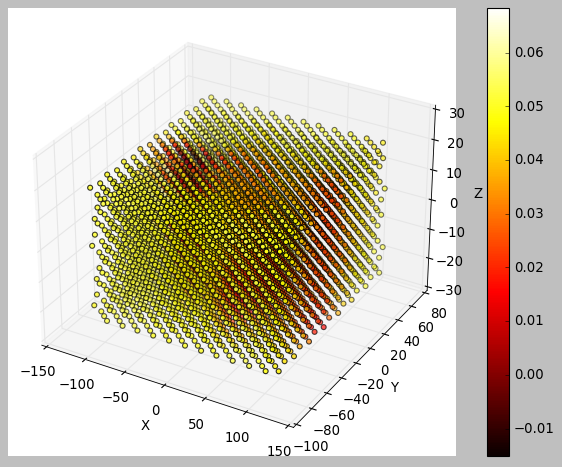

In [134]:
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')
ax.set_facecolor("white")
img = ax.scatter(df_p['x'], df_p['y'], df_p['z'], c=df_p['vx'], cmap=plt.hot())
fig.colorbar(img)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

plt.show()

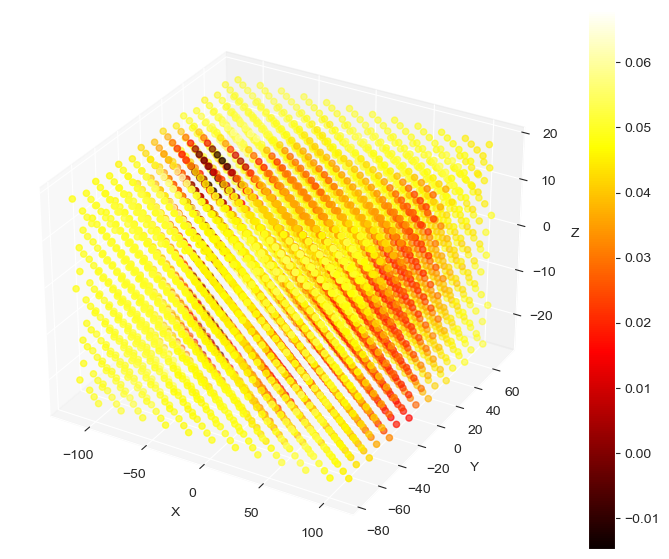

In [118]:
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')
ax.set_facecolor("white")

img = ax.scatter(df_result['x'], df_result['y'], df_result['z'], c=df_result['vx'], cmap=plt.hot())
fig.colorbar(img)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

plt.show()

In [119]:
fig = px.scatter_3d(df_p, x='x', y='y', z='z', color='vx', opacity=0.35)
# fig.update_layout(scene=dict(xaxis=dict(backgroundcolor='white'),
#                              yaxis=dict(backgroundcolor='white'),
#                              zaxis=dict(backgroundcolor='white'),
#                              bgcolor='white'))
# pio.write_html(fig, '3dscatter.html')
fig.show()

In [120]:
fig = px.scatter_3d(df_result, x='x', y='y', z='z', color='vx', opacity=0.35)
# pio.write_html(fig, '3dscatter.html')
fig.show()

In [121]:
fig = px.scatter_3d(df_orig, x='x', y='y', z='z', color='vx', opacity=0.35)
# pio.write_html(fig, '3dscatter.html')
fig.show()

In [122]:
merged_df = pd.merge(df_p, df_result, how='inner', left_on=['x', 'y', 'z'], right_on=['x', 'y', 'z'])

In [123]:
merged_df['vx_error'] = abs(merged_df['vx_x'] - merged_df['vx_y'])
merged_df['vy_error'] = abs(merged_df['vy_x'] - merged_df['vy_y'])
merged_df['vz_error'] = abs(merged_df['vz_x'] - merged_df['vz_y'])


In [137]:
merged_df

,x,y,z,vx_x,vy_x,vz_x,vx_y,vy_y,vz_y,MAE_vx,MAE_vy,MAE_vz,vx_error,vy_error,vz_error
0,-117.0,71.0,-25.0,0.048930,0.004642,-0.000857,0.048976,0.004686,-0.000800,0.000458,0.000447,0.000565,0.000046,0.000045,0.000057
1,-97.0,71.0,-25.0,0.049188,0.004064,0.001669,0.049244,0.004076,0.001700,0.311099,0.112419,0.053187,0.000057,0.000012,0.000031
2,-78.0,71.0,-25.0,0.049293,0.003150,0.001643,0.049233,0.003042,0.001595,0.029203,0.002223,0.020863,0.000060,0.000108,0.000048
3,-58.0,71.0,-25.0,0.050413,0.002313,0.003913,0.050366,0.002316,0.003880,0.020497,0.152170,0.091973,0.000047,0.000003,0.000034
4,-38.0,71.0,-25.0,0.048525,0.003128,0.003365,0.048500,0.003084,0.003415,0.025638,0.013740,0.063875,0.000026,0.000044,0.000049
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5285,22.0,-76.0,18.0,0.049427,-0.004924,-0.000779,0.049392,-0.005029,-0.000784,NaN,NaN,NaN,0.000034,0.000105,0.000005
5286,41.0,-76.0,18.0,0.052595,-0.006989,0.004092,0.052538,-0.007098,0.004070,NaN,NaN,NaN,0.000057,0.000109,0.000022
5287,61.0,-76.0,18.0,0.054063,-0.006878,0.004454,0.054187,-0.006932,0.004520,NaN,NaN,NaN,0.000125,0.000054,0.000065
5288,81.0,-76.0,18.0,0.051765,-0.005164,0.002592,0.051780,-0.005201,0.002658,NaN,NaN,NaN,0.000016,0.000037,0.000066


In [126]:
merged_df['vx_error'].mean(), merged_df[merged_df['vx_x'] <0.02]['vx_error'].mean()

(0.0001105849499175139, 0.00019587090327124709)

In [108]:
df_p

,x,y,z,vx,vy,vz
0,-117.0,71.0,-25.0,0.489302,0.046416,-0.008567
1,-97.0,71.0,-25.0,0.491878,0.040637,0.016688
2,-78.0,71.0,-25.0,0.492928,0.031500,0.016431
3,-58.0,71.0,-25.0,0.504130,0.023132,0.039133
4,-38.0,71.0,-25.0,0.485254,0.031279,0.033655
...,...,...,...,...,...,...
5285,22.0,-76.0,18.0,0.494265,-0.049241,-0.007788
5286,41.0,-76.0,18.0,0.525953,-0.069891,0.040921
5287,61.0,-76.0,18.0,0.540628,-0.068779,0.044545
5288,81.0,-76.0,18.0,0.517649,-0.051637,0.025924


In [84]:
df_result

,x,y,z,vx,vy,vz,MAE_vx,MAE_vy,MAE_vz
0,-117.0,71.0,-25.0,0.489760,0.046864,-0.008002,0.000458,0.000447,0.000565
240,-97.0,71.0,-25.0,0.492443,0.040759,0.016998,0.311099,0.112419,0.053187
480,-78.0,71.0,-25.0,0.492333,0.030420,0.015950,0.029203,0.002223,0.020863
720,-58.0,71.0,-25.0,0.503660,0.023162,0.038796,0.020497,0.152170,0.091973
960,-38.0,71.0,-25.0,0.484998,0.030841,0.034149,0.025638,0.013740,0.063875
...,...,...,...,...,...,...,...,...,...
1268400,22.0,-76.0,18.0,0.493922,-0.050291,-0.007836,NaN,NaN,NaN
1268640,41.0,-76.0,18.0,0.525382,-0.070981,0.040704,NaN,NaN,NaN
1268880,61.0,-76.0,18.0,0.541873,-0.069319,0.045195,NaN,NaN,NaN
1269120,81.0,-76.0,18.0,0.517805,-0.052012,0.026583,NaN,NaN,NaN


In [79]:
0.489760-0.489302

0.00045799999999995844

In [13]:
df_orig.head()

,x,y,z,vx,vy,vz,px,py,pz,time,distance
3395962,-117.0,87.0,-33.0,0.47,0.04,-0.03,-1.17,-1.23,2.11,5,150.0
3395963,-113.0,87.0,-33.0,0.47,0.04,-0.02,-0.83,-1.25,2.19,5,146.0
3395964,-109.0,87.0,-33.0,0.47,0.04,-0.02,-0.62,-1.21,2.17,5,143.0
3395965,-105.0,87.0,-33.0,0.48,0.04,-0.01,-0.53,-1.17,2.11,5,140.0
3395966,-101.0,87.0,-33.0,0.48,0.04,-0.01,-0.55,-1.18,2.09,5,137.0


In [109]:
df_csv

,x,y,z,vx,vy,vz
0,-125.078910,86.888915,-33.059413,0.046131,0.003496,-0.003103
1,-121.116733,86.888915,-33.059413,0.046414,0.003655,-0.003025
2,-117.154557,86.888915,-33.059413,0.046735,0.003796,-0.002813
3,-113.192381,86.888915,-33.059413,0.047062,0.003905,-0.002452
4,-109.230205,86.888915,-33.059413,0.047351,0.003967,-0.001945
...,...,...,...,...,...,...
101371,108.689479,-83.484657,34.297581,-0.004957,-0.002706,0.010079
101372,112.651656,-83.484657,34.297581,-0.005408,-0.002691,0.009741
101373,116.613832,-83.484657,34.297581,-0.005732,-0.002642,0.009393
101374,120.576008,-83.484657,34.297581,-0.005960,-0.002588,0.009134


In [103]:
df_orig.head()

,x,y,z,vx,vy,vz,px,py,pz,time,distance
3395962,-117.0,87.0,-33.0,0.47,0.04,-0.03,-1.17,-1.23,2.11,5,150.0
3395963,-113.0,87.0,-33.0,0.47,0.04,-0.02,-0.83,-1.25,2.19,5,146.0
3395964,-109.0,87.0,-33.0,0.47,0.04,-0.02,-0.62,-1.21,2.17,5,143.0
3395965,-105.0,87.0,-33.0,0.48,0.04,-0.01,-0.53,-1.17,2.11,5,140.0
3395966,-101.0,87.0,-33.0,0.48,0.04,-0.01,-0.55,-1.18,2.09,5,137.0


In [104]:
df_orig[(df_orig["z"] == -33) & (df_orig["y"] == 87) & (df_orig["x"] == -117)]

,x,y,z,vx,vy,vz,px,py,pz,time,distance
3395962,-117.0,87.0,-33.0,0.47,0.04,-0.03,-1.17,-1.23,2.11,5,150.0


In [89]:
df_csv.columns = ['x','y','z','vx','vy','vz']

In [91]:
df_csv['x'] = round(df_csv['x'],0)
df_csv['y'] = round(df_csv['y'],0)
df_csv['z'] = round(df_csv['z'],0)

In [113]:
df_csv[(df_csv["z"] == -33) & (df_csv["y"] == 87) & (df_csv["x"] == -117)]

,x,y,z,vx,vy,vz
2,-117.0,87.0,-33.0,0.046735,0.003796,-0.002813
50690,-117.0,87.0,-33.0,-0.001173,-0.001228,0.002114


In [106]:
df_csv

,x [mm],y [mm],z [mm],Velocity x [m/s],Velocity y [m/s],Velocity z [m/s]
0,-125.078910,86.888915,-33.059413,0.046131,0.003496,-0.003103
1,-121.116733,86.888915,-33.059413,0.046414,0.003655,-0.003025
2,-117.154557,86.888915,-33.059413,0.046735,0.003796,-0.002813
3,-113.192381,86.888915,-33.059413,0.047062,0.003905,-0.002452
4,-109.230205,86.888915,-33.059413,0.047351,0.003967,-0.001945
...,...,...,...,...,...,...
101371,108.689479,-83.484657,34.297581,-0.004957,-0.002706,0.010079
101372,112.651656,-83.484657,34.297581,-0.005408,-0.002691,0.009741
101373,116.613832,-83.484657,34.297581,-0.005732,-0.002642,0.009393
101374,120.576008,-83.484657,34.297581,-0.005960,-0.002588,0.009134


In [79]:
df_result[['orig_x', 'orig_y', 'orig_z']] = pd.DataFrame(df_result['original'].tolist(), index=df_result.index)
df_p[['orig_x', 'orig_y', 'orig_z']] = pd.DataFrame(df_p['original'].tolist(), index=df_p.index)

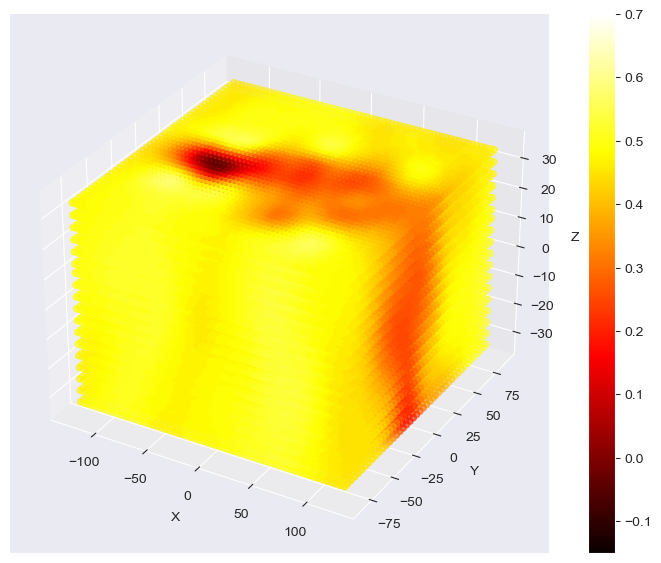

In [98]:
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

img = ax.scatter(df_orig['x'], df_orig['y'], df_orig['z'], c=df_orig['vx'], cmap=plt.hot())
fig.colorbar(img)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

plt.show()

In [104]:
fig = px.scatter_3d(df_orig, x='x', y='y', z='z', color='vx', opacity=0.35)
pio.write_html(fig, '3dscatter.html')
fig.show()

In [1]:
df_result.shape, df_p.shape, df_orig.shape

NameError: name 'df_result' is not defined